# Systemy inspekcji wizualnej  
## Laboratorium  4
Temat: Podstawowe operacje na obrazach

Instrukcję opracował: dr inż. Łukasz Jeleń  
  
Wrocław 2022

---

Nazwisko i Imię:  Mateusz Śliwiński  
Nr albumu:  253403  
data wykonania ćwiczenia:  07.11.2023

---

# 1. Narzędzia

Na zjęciach korzystamy z pythnona, a jako środowisko pracy mają Państwo do wyboru Google Colab (https://colab.research.google.com) - wersja online, lub Anaconda Navigator (https://www.anaconda.com/) - wymaga instalacji na własnym komputerze. Są to oczywiście tylko propozycje.

# 2. Zadania

## Zadanie 1 - wczytywanie, wyznaczanie histogramów

Dla 3 obrazów wykonanych na poprzednich zajęciach:

### a) Histogramy w odcieniach szarości
  
Wyznacz histogram odcieni szarości (należy zamienić obraz np.: za pomoca `COLOR_BGR2GRAY`) wczytywanych

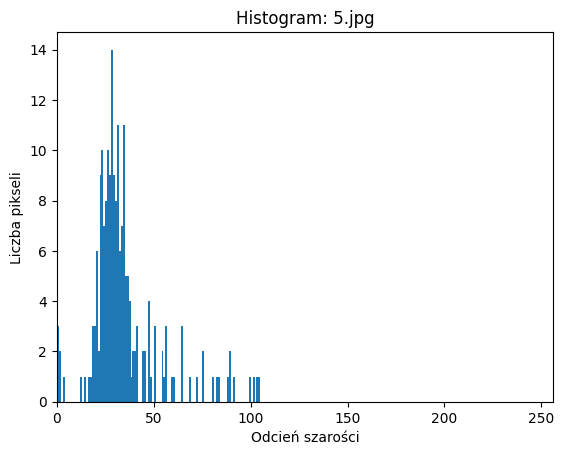

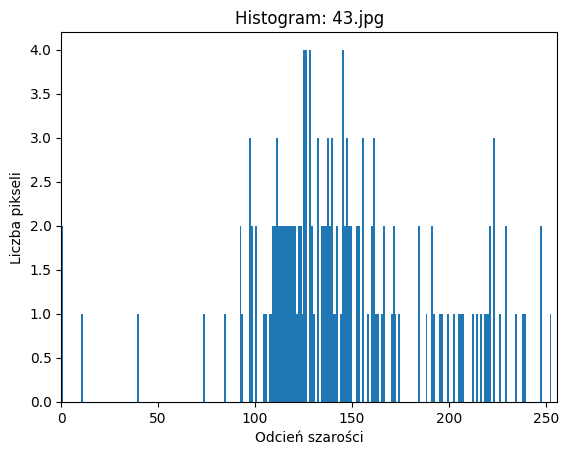

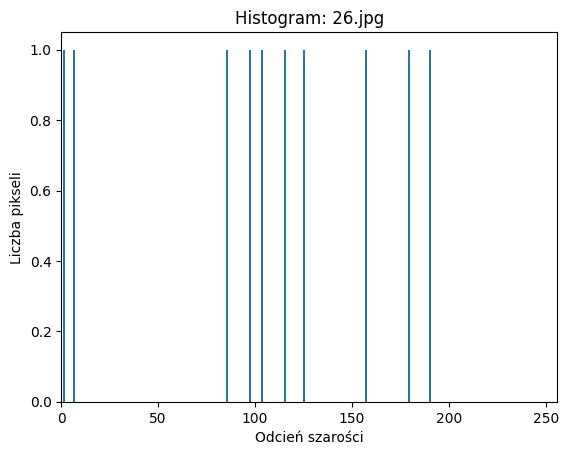

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

folder_path = "UV/"



histograms = []
count=0
limit=3
for filename in os.listdir(folder_path):
  if count >= limit:
    break
  count+=1
  image = cv2.imread(os.path.join(folder_path, filename))

  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  histogram = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

  plt.figure()
  plt.hist(histogram.ravel(), bins=256, range=(0, 256))
  plt.title(f'Histogram: {filename}')
  plt.xlabel('Odcień szarości')
  plt.ylabel('Liczba pikseli')
  plt.xlim([0, 256])

  plt.show()

### b) Histogramy obrazu kolorowego  
  
Wyznacz histogram kolorowy wczytywanych obrazów

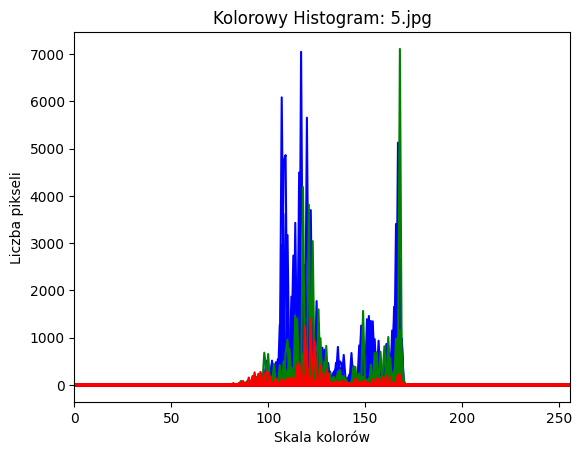

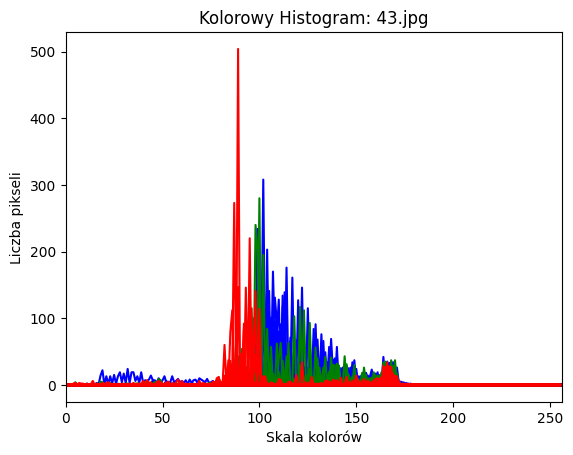

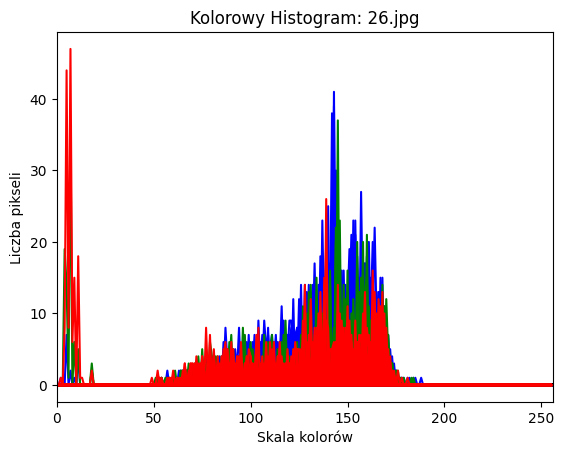

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt


folder_path = 'UV/'
count=0
limit=3
for filename in os.listdir(folder_path):
  if count >= limit:
    break
  count+=1
  image = cv2.imread(os.path.join(folder_path, filename))

  histogram = cv2.calcHist([image], [0, 1, 2], None, [256, 256, 256], [0, 256, 0, 256, 0, 256])

  plt.figure()
  plt.title(f'Kolorowy Histogram: {filename}')
  plt.xlabel('Skala kolorów')
  plt.ylabel('Liczba pikseli')
  plt.xlim([0, 256])

  for i, color in enumerate(['blue', 'green', 'red']):
    plt.plot(histogram[:, i], color=color)

  plt.show()

## Zadanie 2 - operacje podstawowe na obrazach  
  
Dla obrazów wykonanych na poprzednich zajęciach:

### a) Suma obrazów  
  
Po wczytaniu i zamianie 2 obrazów kolorowych na obrazy monochromatyczne wyznacz ich sumę jako $y_{ij} = Normalize[f_{ij} + g_{ij}]$. Przeprowadź noramalizację na dwa sposoby:  
- Poprzez obcięcie wartości powyżej 255 do 255  
  
- Poprzez: $y_{ij} = \frac{f_{ij}}{2} + \frac{g_{ij}}{2}$  
  
Zaobserwowane różnice opis we wnioskach do Laboratorium

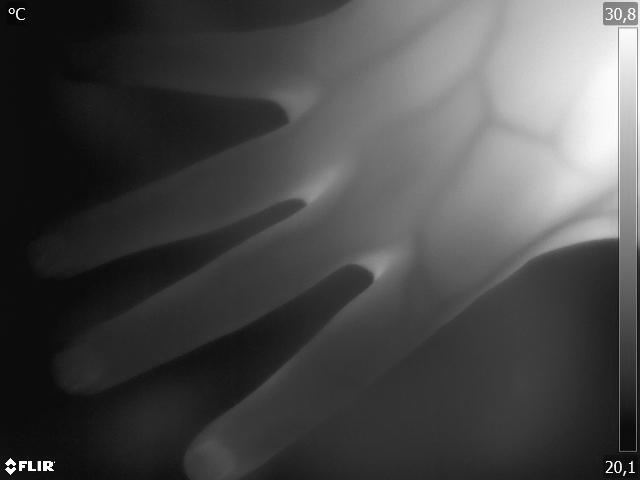

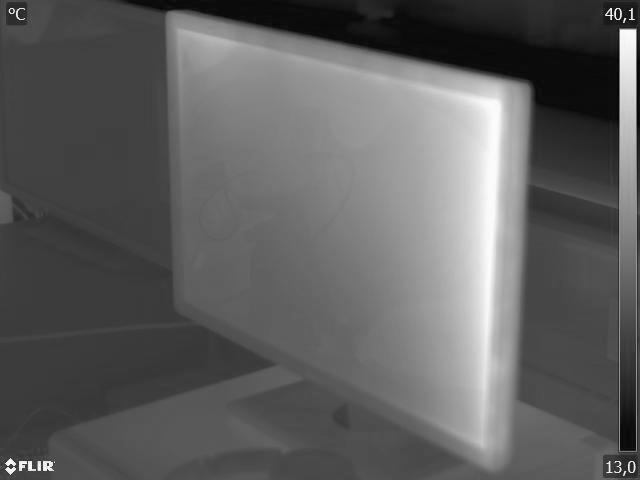

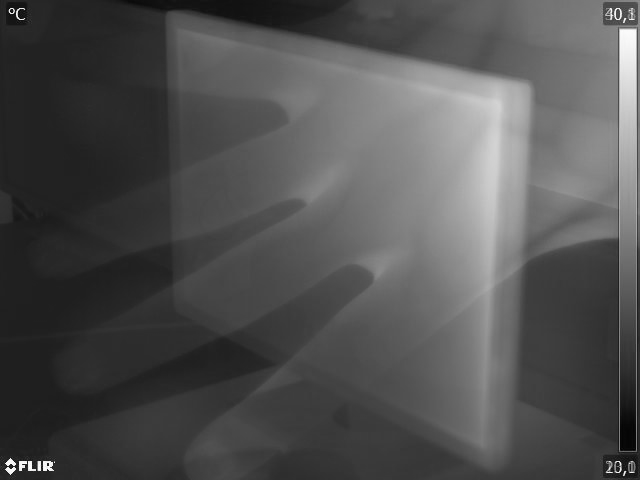

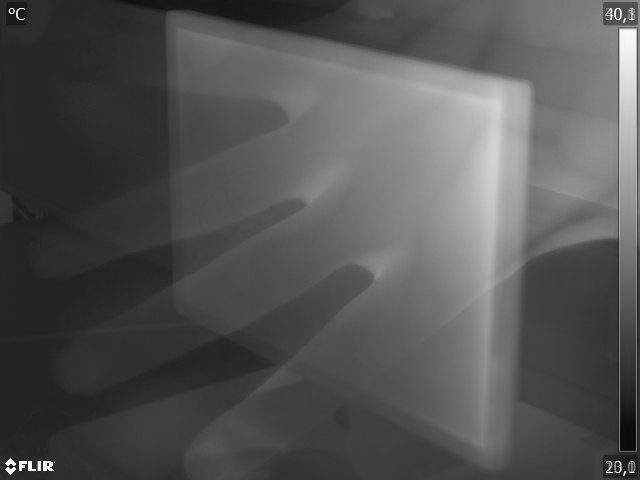

In [ ]:
import numpy as np
from google.colab.patches import cv2_imshow
image_path1 = 'UV/3.jpg'
image_path2 = 'UV/44.jpg'

image1 = cv2.imread(image_path1)
image2 = cv2.imread(image_path2)

gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY).astype(int)
gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY).astype(int)

difference_normalized = cv2.normalize((gray_image1+ gray_image2), None,0, 255, cv2.NORM_MINMAX)
# sum_of_images = gray_image1.astype(np.float32) + gray_image2.astype(np.float32)
# difference_normalized = cv2.normalize(sum_of_images, None, 0.0, 1.0, cv2.NORM_MINMAX)

divided_normalization = gray_image1/2 + gray_image2/2

cv2_imshow(gray_image1)
cv2_imshow(gray_image2)
cv2_imshow(difference_normalized.astype(np.uint8))
cv2_imshow(divided_normalization)

### b) Różnica obrazów  
  
Po wczytaniu i zamianie 2 obrazów kolorowych na obrazy monochromatyczne wyznacz ich różnicę jako $y_{ij} = Normalize[f_{ij} - g_{ij}]$.  
  
- Dokonaj normalizacji do przedziału `[0,255]` przez obcinanie poniżej 0 do 0  
- Wyznacz różnicę bezwzględną: $y_{ij} = abs(f_{ij} - g_{ij})$  
  
Zaobserwowane różnice opis we wnioskach do Laboratorium

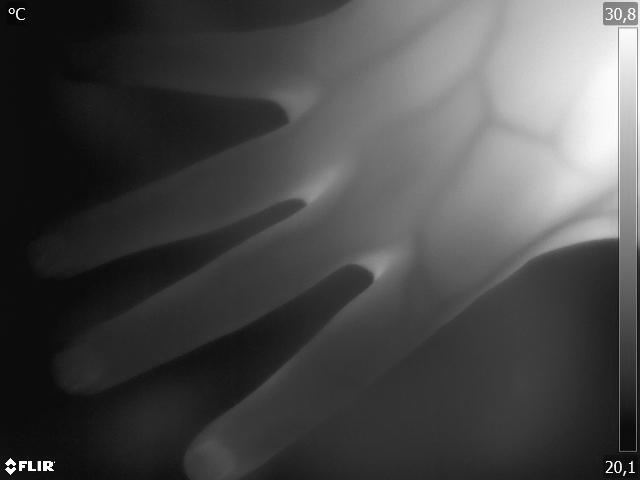

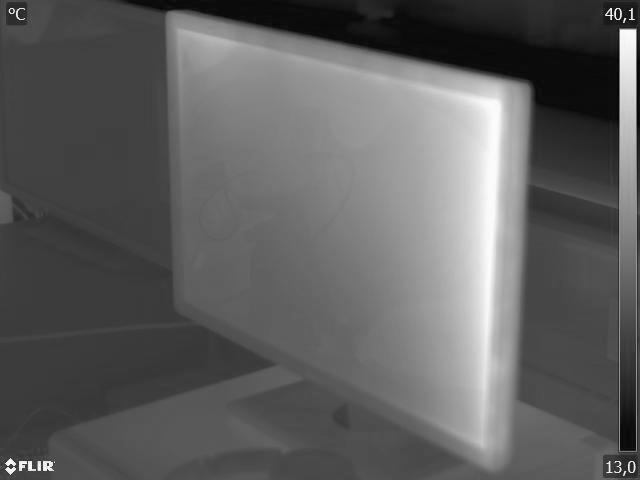

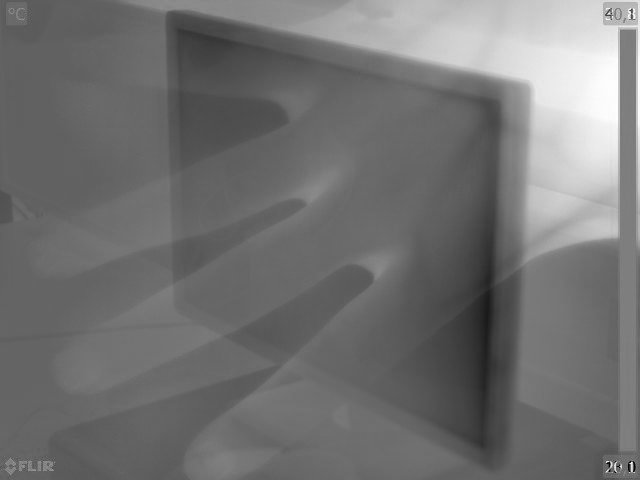

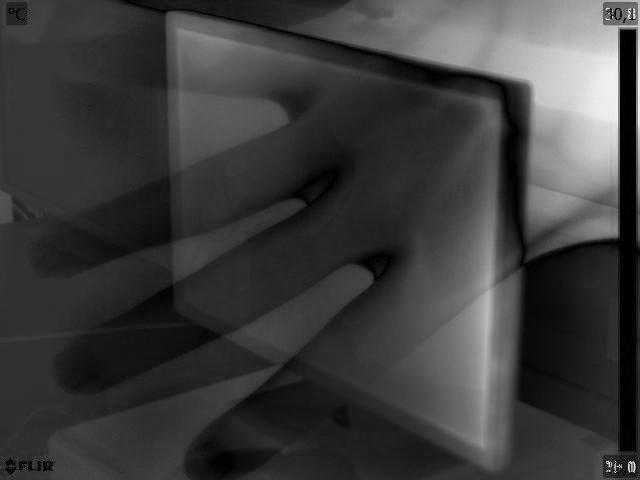

In [ ]:
import numpy as np
from google.colab.patches import cv2_imshow
image_path1 = 'UV/3.jpg'
image_path2 = 'UV/44.jpg'

image1 = cv2.imread(image_path1)
image2 = cv2.imread(image_path2)

gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY).astype(int)
gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY).astype(int)

difference_normalized = cv2.normalize(gray_image1- gray_image2, None, 0, 255, cv2.NORM_MINMAX)

absolute_difference = np.abs(gray_image1 - gray_image2)

cv2_imshow(gray_image1)
cv2_imshow(gray_image2)
# cv2_imshow(difference)
cv2_imshow(difference_normalized)
cv2_imshow(absolute_difference)

### c) Maksimum i minimum  
  
Po wczytaniu i zamianie 2 obrazów kolorowych na obrazy monochromatyczne wyznacz:
  
- Maksimum z dwóch obrazów przez $y_{ij} = Max(f_{ij}, g_{ij})$
- Minimum z dwóch obrazów przez $y_{ij} = Min(f_{ij}, g_{ij})$  
  
Zaobserwowane różnice opis we wnioskach do Laboratorium

In [ ]:
import numpy as np
img1 = gray_image1
img2 = gray_image2
max_channels1 = np.amax([np.amax(img1[:,0]), np.amax(img1[:,1]), np.amax(img1[:,2])])
max_channels2 = np.amax([np.amax(img2[:,0]), np.amax(img2[:,1]), np.amax(img2[:,2])])
min_channels1 = np.amin([np.amin(img1[:,0]), np.amin(img1[:,1]), np.amin(img1[:,2])])
min_channels2 = np.amin([np.amin(img2[:,0]), np.amin(img2[:,1]), np.amin(img2[:,2])])

max_channels1_2 = np.amax(np.concatenate((img1.flatten(),img2.flatten())))
min_channels1_2 = np.amin(np.concatenate((img1.flatten(),img2.flatten())))
max_channels2_2 = np.amax((img1.flatten(),img2.flatten()))
min_channels2_2 = np.amin((img1.flatten(),img2.flatten()))

print("Photo 1: max ",max_channels1_2, "min",min_channels1_2 )
print("Photo 2: max ",max_channels2_2, "min",min_channels2_2 )

print("Max channels photo 1: ",max_channels1)
print("Max channels photo 2: ",max_channels2)
print("Min channels photo 1: ",min_channels1)
print("Min channels photo 2: ",min_channels2)

Photo 1: max  255 min 1
Photo 2: max  255 min 1
Max channels photo 1:  48
Max channels photo 2:  112
Min channels photo 1:  7
Min channels photo 2:  46


### d) Operacje logiczne  
  
Po wczytaniu 2 obrazów kolorowych wyknoaj:  
  
- zamień obrazy na obrazy monochromatyczne i wykonaj operacje `OR`, `XOR` i `AND`
- zamień obrazy na obrazy binarne i wykonaj operacje `OR`, `XOR` i `AND`
  
Podsumuj obsewrwacje we wnioskach do Laboratorium

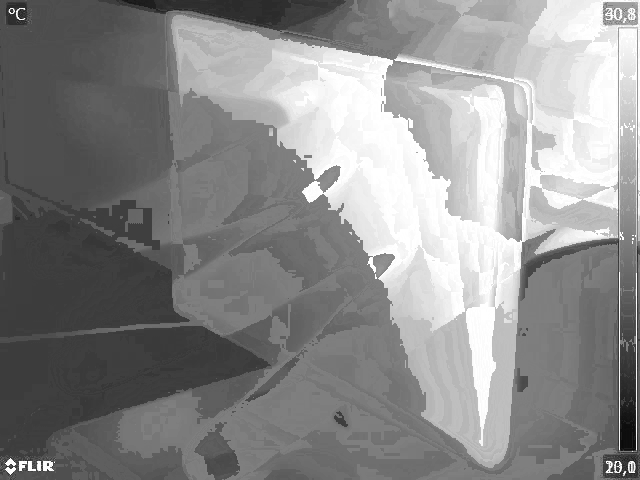

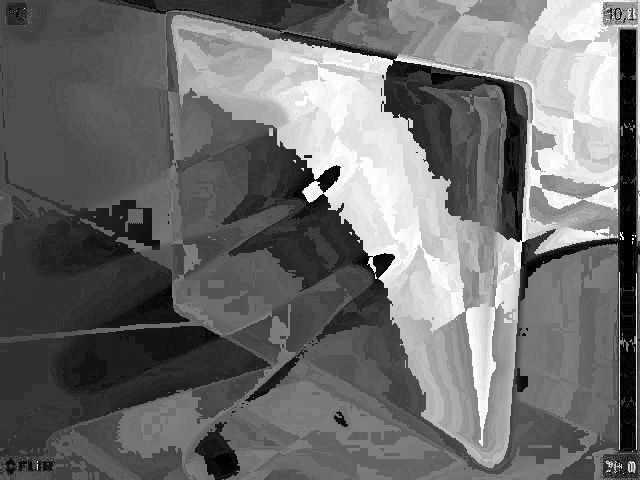

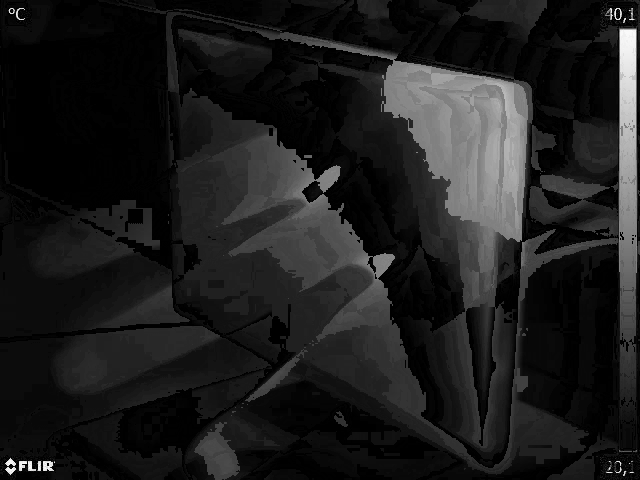

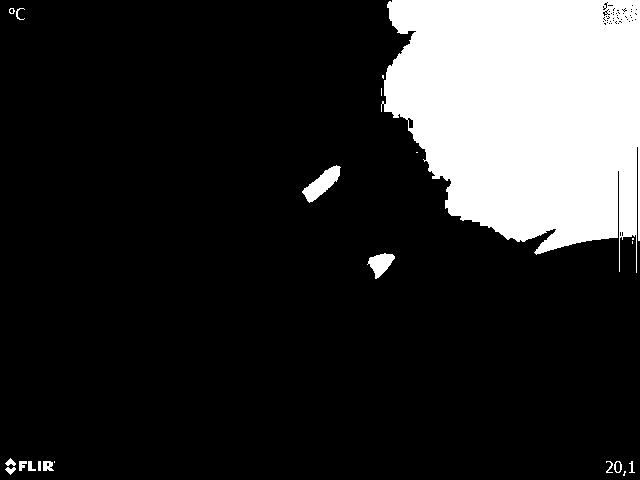

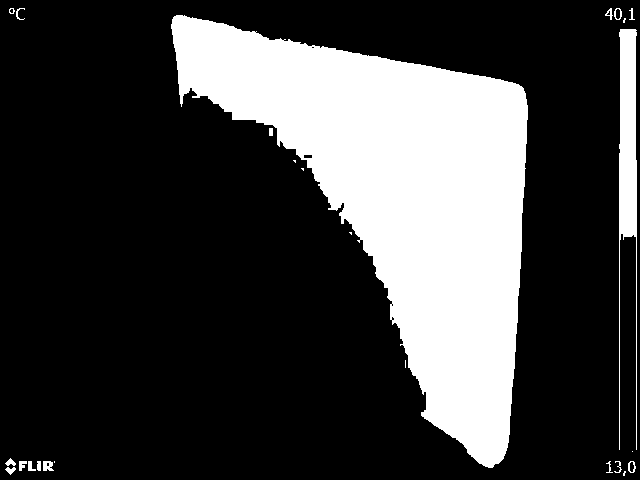

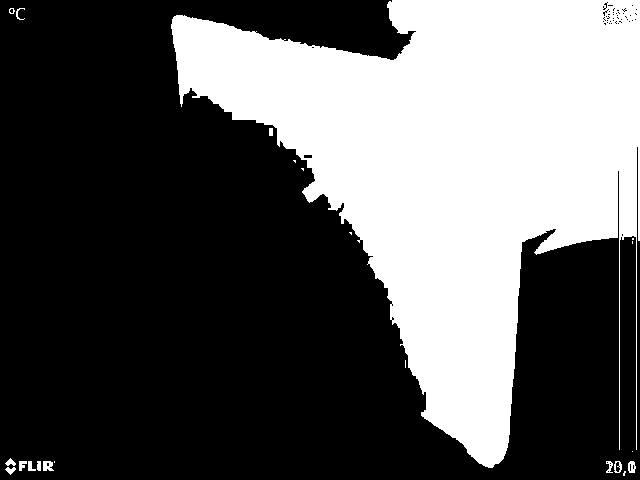

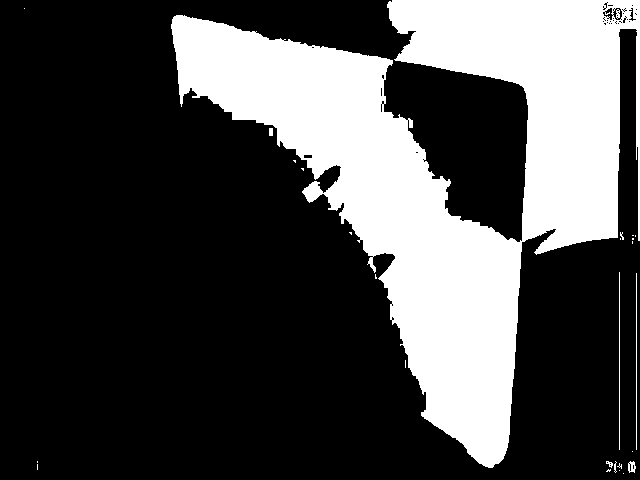

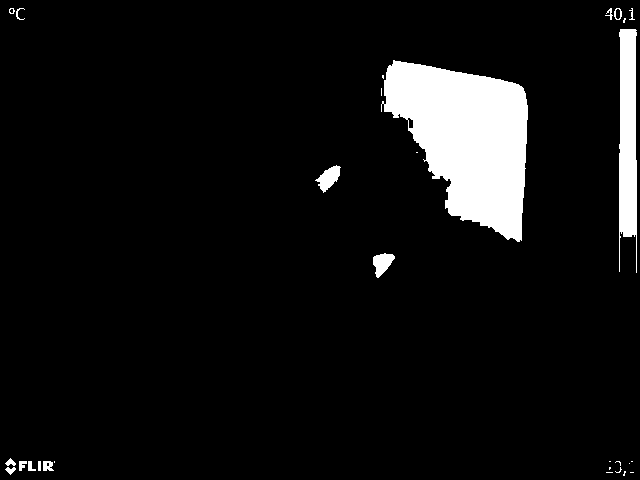

In [ ]:
img1 = gray_image1
img2 = gray_image2

image1 = cv2.imread(image_path1)
image2 = cv2.imread(image_path2)

#==========================================#
#================MONOCHROME================#
#==========================================#
bitwiseOr1 = cv2.bitwise_or(img1, img2)
cv2_imshow(bitwiseOr1)
bitwiseXor1 = cv2.bitwise_xor(img1, img2)
cv2_imshow(bitwiseXor1)
bitwiseAnd1 = cv2.bitwise_and(img1, img2)
cv2_imshow(bitwiseAnd1)
#==========================================#
#==================BINARY==================#
#==========================================#
(thresh, black_image1) = cv2.threshold(img1, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(black_image1)
(thresh, black_image2) = cv2.threshold(img2, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(black_image2)

bitwiseOr2 = cv2.bitwise_or(black_image1, black_image2)
cv2_imshow(bitwiseOr2)
bitwiseXor2 = cv2.bitwise_xor(black_image1, black_image2)
cv2_imshow(bitwiseXor2)
bitwiseAnd2 = cv2.bitwise_and(black_image1, black_image2)
cv2_imshow(bitwiseAnd2)


## Zadanie 3 - Operacje podstawowe na pojedynczym obrazie
  
Dla 3 obrazów wykonanych na poprzednich zajęciach:  

### a)  Transformacja Potęgowa
  
Zaimplementuj transformację potęgową (korekcja gamma) wyrażoną przez zależność: $y_{ij}= c*f_{ij}^{\gamma}$, gdzie stałe $c$ i $\gamma$ należy podać z klawiatury. Przeprowadź ekspertymenty dla różnych wartości $\gamma$ (dla wartości z przedziału `[0,0.9]` oraz wartości `>1`)

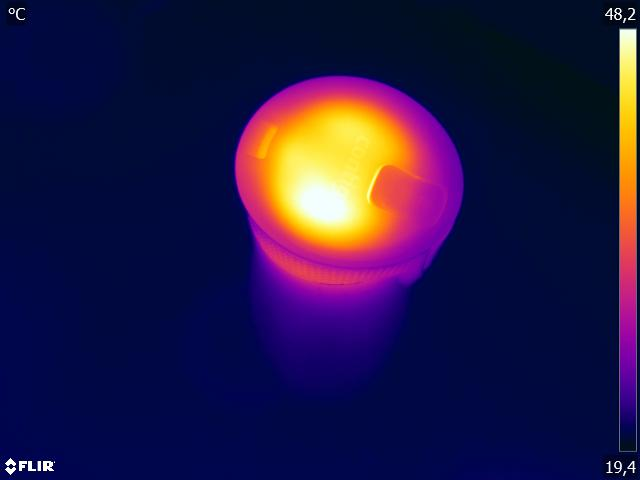

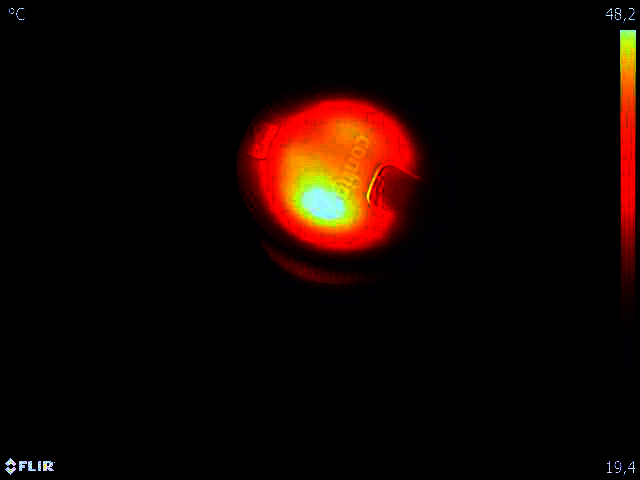

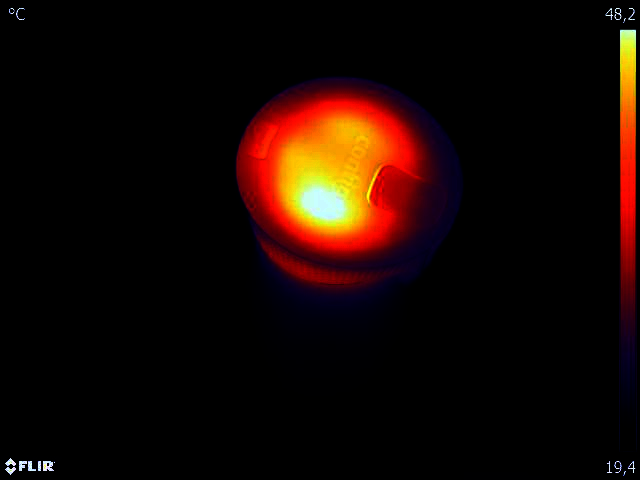

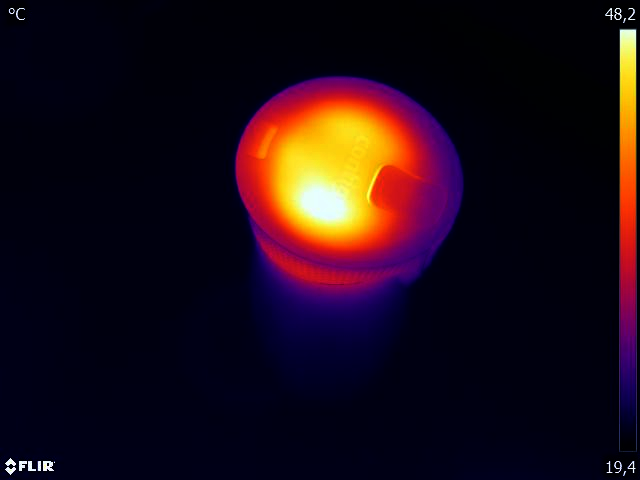

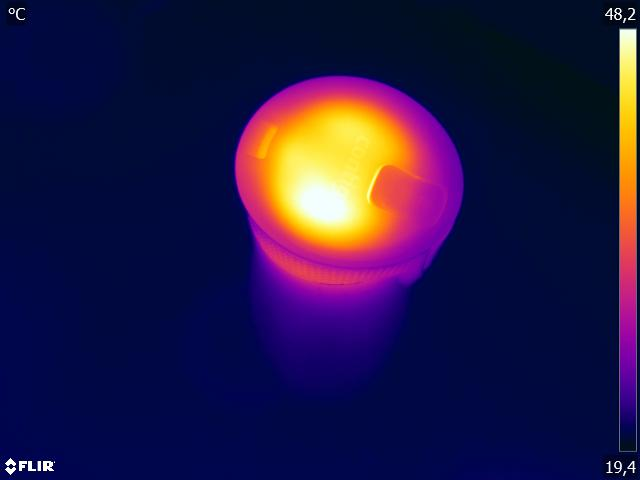

...

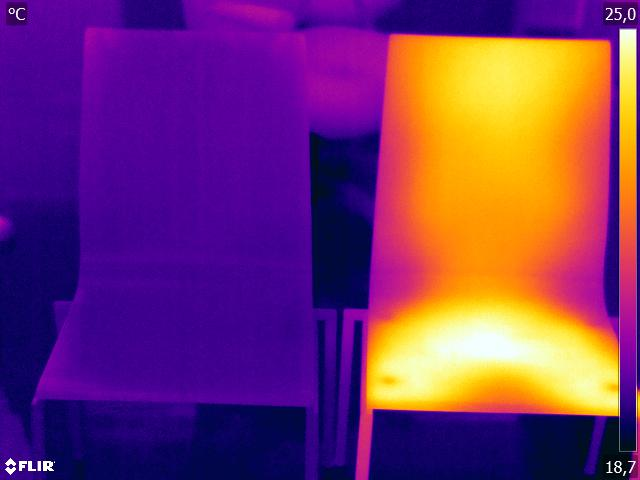

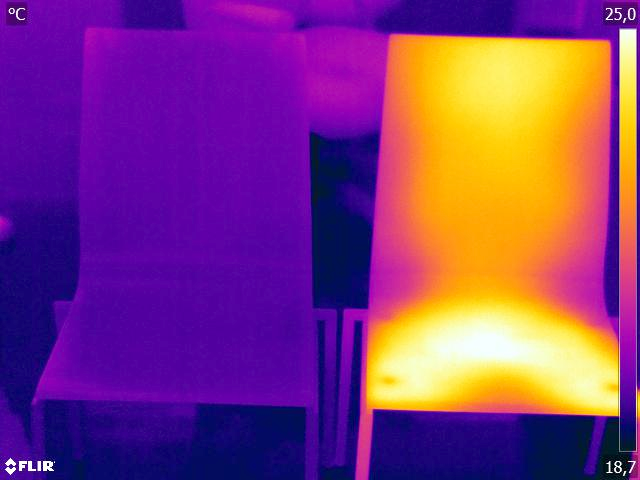

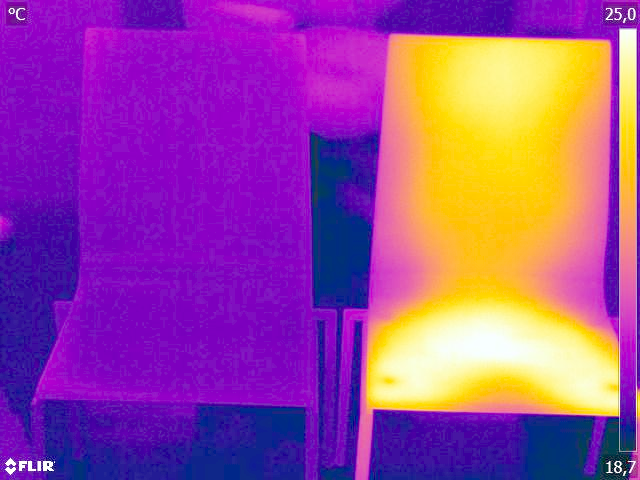

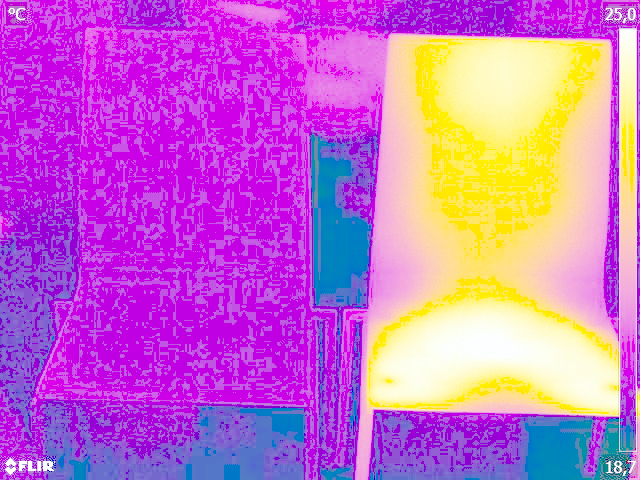

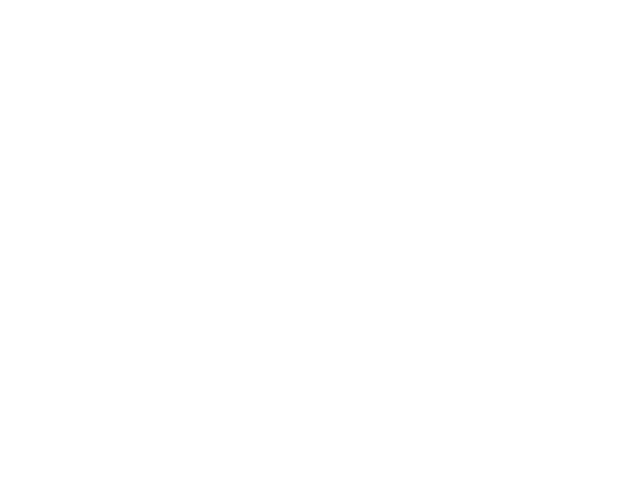

In [ ]:

def gammaCorrection(src, c, gamma):

    table = np.array([((i / 255.0) ** gamma)*c * 255 for i in np.arange(0, 256)]).astype(np.uint8)
    # table = np.array(table, np.uint8)

    return cv2.LUT(src, table)


gamma = 10
c = 1
img = cv2.imread('UV/39.jpg')
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(img)
cv2_imshow(gammaImg)
gamma = 5
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 2
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 1
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.8
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.5
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.2
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)

gamma = 10
c = 1
img = cv2.imread('UV/2.jpg')
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(img)
cv2_imshow(gammaImg)
gamma = 5
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 2
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 1
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.8
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.5
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.2
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)

gamma = 10
c = 1
img = cv2.imread('UV/34.jpg')
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(img)
cv2_imshow(gammaImg)
gamma = 5
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 2
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 1
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.8
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.5
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0.2
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)
gamma = 0
gammaImg = gammaCorrection(img, c=c, gamma=gamma)
cv2_imshow(gammaImg)

### b)  Negacja obrazu  
  
Zaimplementuj negację obrazu wykorzystując informację, że $y_{ij}= L - 1 - f_{ij}$, gdzie $L=2^k$, a $k$ jest ilością bitów w obrazie.  
  
Wskazówka: Obraz monochromatyczny jest obrazem 8-bitowym, zatem w tym przypadku $L=255$

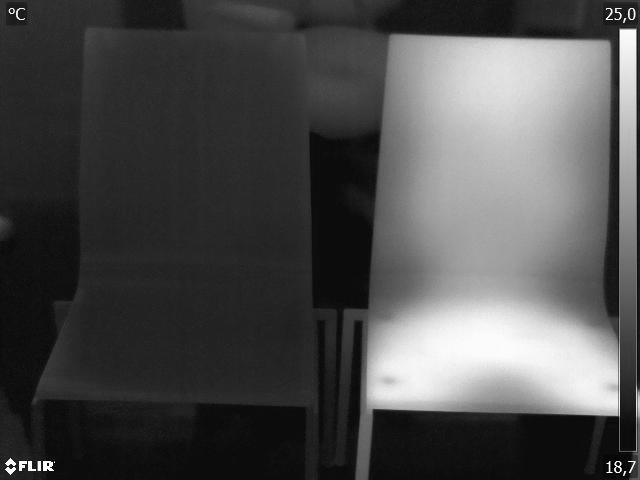

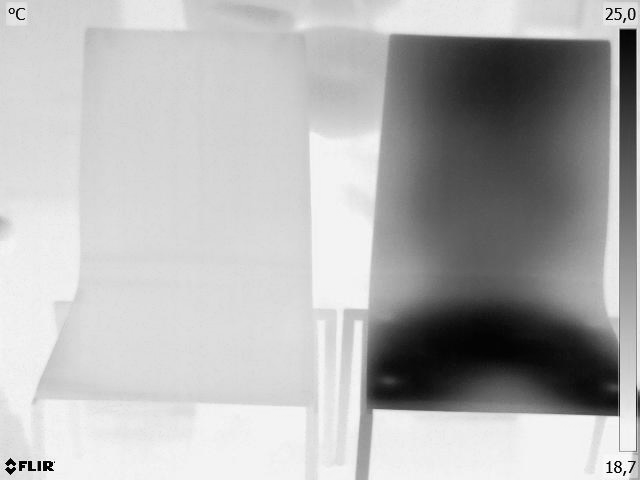

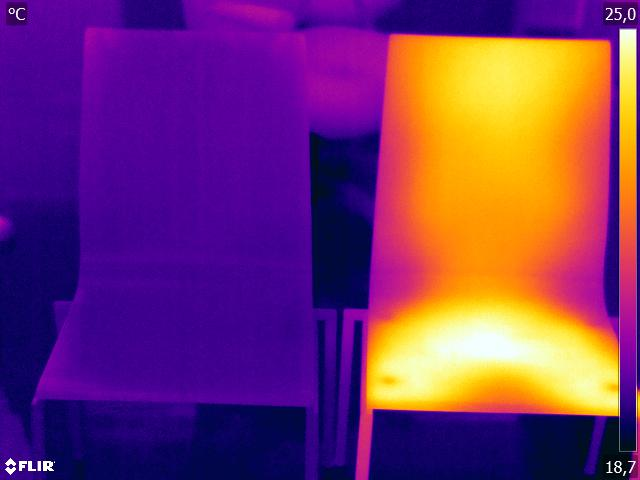

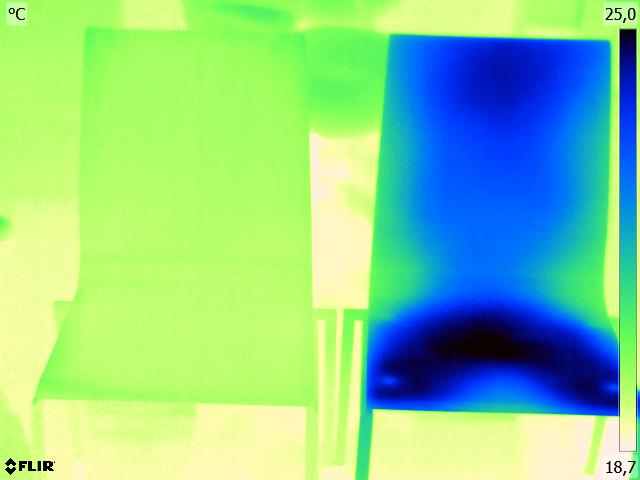

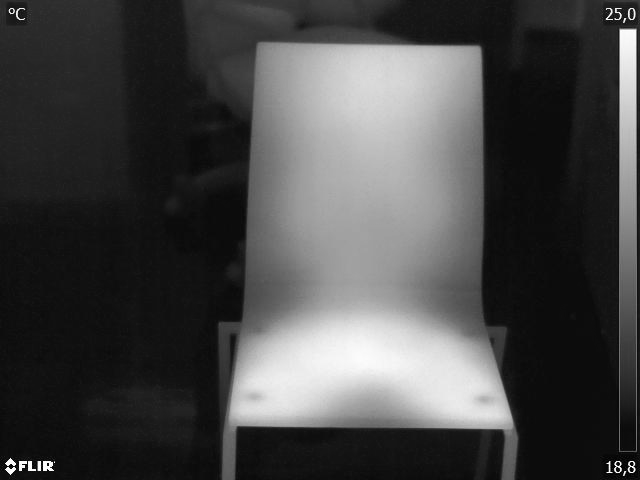

...

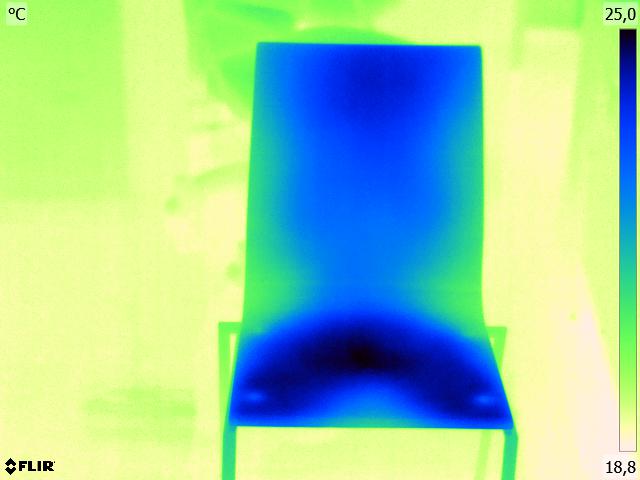

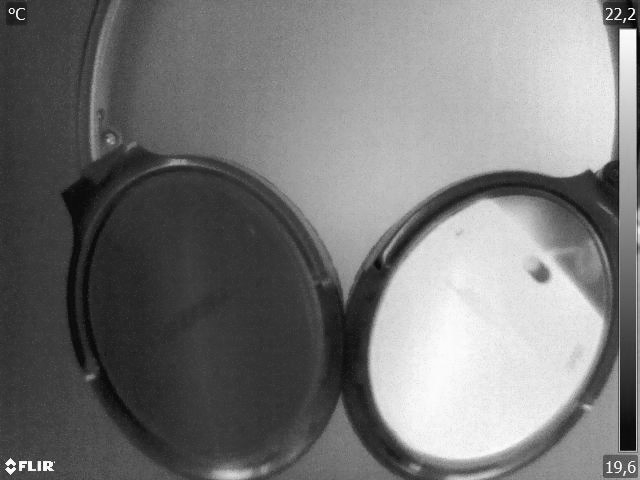

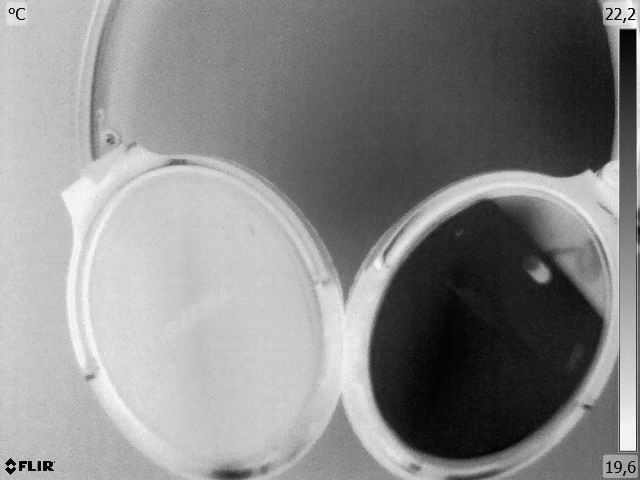

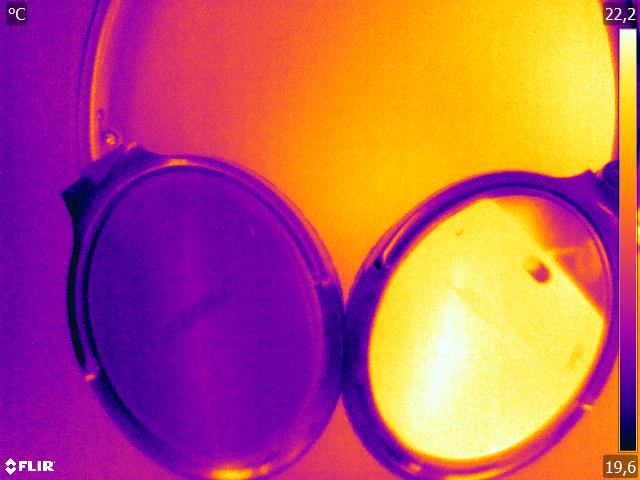

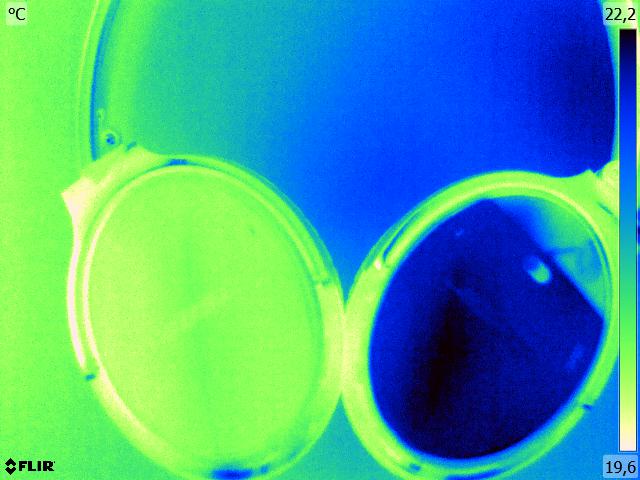

In [ ]:
image1 = cv2.imread('UV/34.jpg') #GRAY#
image2 = cv2.imread('UV/34.jpg')
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

gray_negative = abs(255-image1)
colored_negative = abs(255-image2)


cv2_imshow(image1)
cv2_imshow(gray_negative)
cv2_imshow(image2)
cv2_imshow(colored_negative)

image1 = cv2.imread('UV/35.jpg') #GRAY#
image2 = cv2.imread('UV/35.jpg')
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

gray_negative = abs(255-image1)
colored_negative = abs(255-image2)


cv2_imshow(image1)
cv2_imshow(gray_negative)
cv2_imshow(image2)
cv2_imshow(colored_negative)

image1 = cv2.imread('UV/7.jpg') #GRAY#
image2 = cv2.imread('UV/7.jpg')
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

gray_negative = abs(255-image1)
colored_negative = abs(255-image2)


cv2_imshow(image1)
cv2_imshow(gray_negative)
cv2_imshow(image2)
cv2_imshow(colored_negative)


## Wnioski  
  
Na podstawie przeporwadzonych eksperymentów opisz jakie zaobserwowałaś/eś różnice między poszczególnymi obrazami dla wykonywanych operacji obrazowych.

2)A  
Na początku zostały przedstawione dwa obrazy, które miały zostać zsumowane. Wyniki sumy okazały się identyczne, niezależnie od zastosowanej metody. Warto jednak zauważyć, że rezultat tej sumy byłby inny, gdyby nie dokonano konwersji obrazu z wartości typu uint8 na int.  
  
2)B  
Po odjęciu obrazów ujawniły się znaczne różnice między nimi. Tam, gdzie w przypadku dodawania obrazy były identyczne, obraz uzyskany przez odjęcie, używając funkcji $y_{ij} = abs(f_{ij} - g_{ij})$, był znacznie ciemniejszy.
    
2)C  
W przypadku obrazów monochromatycznych maksymalna wartość piksela wynosiła 255, co było zgodne z oczekiwaniami, ponieważ jest to najwyższa możliwa wartość dla piksela w obrazie o głębokości bitowej 8 (8-bitowy obraz). Minimalna wartość piksela wynosiła 1, co wskazywało, że obrazy zawierały piksele o wartościach od 1 do 255, a nie od 0 do 255.  
Podczas analizy kanałów obrazów zauważono, że maksymalna wartość piksela w kanałach obrazu nr 1 wynosiła 48, a w kanałach obrazu nr 2 wynosiła 112. Sugeruje to istnienie różnic w intensywności pikseli między obrazami. Również minimalna wartość piksela w kanałach obrazu nr 1 wynosiła 7, a w kanałach obrazu nr 2 wynosiła 46.  
  
2)D  
**Obraz monochromatyczny**  
Operacja OR:
W rezultacie otrzymujemy obraz, który jest jasniejszy niż każdy z obrazów wejściowych. Wszystkie obszary, które są jasne na co najmniej jednym z obrazów, są jasne w obrazie wynikowym.  
  
Operacja XOR:  
W rezultacie otrzymujemy obraz, który pokazuje obszary, gdzie tylko jeden z obrazów wejściowych jest jasny, ale nie oba. Obszary wspólne o jasnościach różnych na obu obrazach są widoczne w obrazie wynikowym.  
  
Operacja AND:  
W rezultacie otrzymujemy obraz, który jest ciemniejszy niż każdy z obrazów wejściowych. Obszary, które są ciemne na co najmniej jednym z obrazów, są ciemne w obrazie wynikowym.  
  
**Obraz binarny**  
Operacja OR:  
Wynikowa binarna wartość piksela będzie równa 1, jeśli przynajmniej jeden z odpowiadających sobie pikseli na obrazach wejściowych jest równy 1. W rezultacie otrzymujemy obraz, w którym białe obszary są wynikiem przynajmniej jednego białego piksela na obrazie wejściowym.  
  
Operacja XOR:  
Wynikowa binarna wartość piksela będzie równa 1 tylko wtedy, gdy odpowiadające sobie piksele na obrazach wejściowych mają różne wartości (0 i 1 lub 1 i 0). W rezultacie otrzymujemy obraz, w którym są widoczne tylko obszary, gdzie wartości pikseli są różne.  
  
Operacja AND:  
Wynikowa binarna wartość piksela będzie równa 1 tylko wtedy, gdy oba odpowiadające sobie piksele na obrazach wejściowych są równe 1. W rezultacie otrzymujemy obraz, w którym są widoczne tylko obszary, gdzie wartości pikseli są jednocześnie równe 1.  